<a href="https://colab.research.google.com/github/sdelta/ImageGen/blob/main/layer_swap_for_style_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install click requests tqdm pyspng ninja imageio-ffmpeg==0.4.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 205 kB 26.5 MB/s 
     |████████████████████████████████| 145 kB 76.8 MB/s 
     |████████████████████████████████| 26.9 MB 1.2 MB/s 


In [3]:
!git clone https://github.com/sdelta/stylegan2-ada-pytorch.git

Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 164, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 164 (delta 17), reused 13 (delta 5), pack-reused 128
Receiving objects: 100% (164/164), 1.15 MiB | 25.55 MiB/s, done.
Resolving deltas: 100% (74/74), done.


In [4]:
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/transfer-learning-source-nets/ffhq-res256-mirror-paper256-noaug.pkl

--2022-12-10 13:27:04--  https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/transfer-learning-source-nets/ffhq-res256-mirror-paper256-noaug.pkl
Resolving nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)... 99.84.208.2, 99.84.208.60, 99.84.208.84, ...
Connecting to nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)|99.84.208.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 295744285 (282M) [binary/octet-stream]
Saving to: ‘ffhq-res256-mirror-paper256-noaug.pkl’

ffhq-res256-mirror- 100%[===================>] 282.04M  28.0MB/s    in 10s     

2022-12-10 13:27:15 (26.9 MB/s) - ‘ffhq-res256-mirror-paper256-noaug.pkl’ saved [295744285/295744285]



In [5]:
!ls

drive				       sample_data
ffhq-res256-mirror-paper256-noaug.pkl  stylegan2-ada-pytorch


In [8]:
orig_net = 'ffhq-res256-mirror-paper256-noaug.pkl'
glasses_net = 'drive/MyDrive/stylegan_finetuning/00018-ffhq_glasses-mirror-paper256-kimg801-resumecustom-freezed10-freezed_mapping/network-snapshot-000201.pkl'
finetuned_net = 'drive/MyDrive/stylegan_vanilla/stylegan2_ffhq_256.pkl'

seeds = '1-15'

In [ ]:
!python stylegan2-ada-pytorch/generate.py --network={orig_net} --seeds={seeds} --outdir drive/MyDrive/stylegan_vanilla/original

Loading networks from "ffhq-res256-mirror-paper256-noaug.pkl"...
Generating image for seed 1 (0/5) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5) ...
Generating image for seed 3 (2/5) ...
Generating image for seed 4 (3/5) ...
Generating image for seed 5 (4/5) ...


In [ ]:
!python stylegan2-ada-pytorch/generate.py --network={glasses_net} --seeds={seeds} --outdir drive/MyDrive/stylegan_vanilla/glasses

Loading networks from "drive/MyDrive/stylegan_finetuning/00006-ffhq_glasses-mirror-auto1-kimg1500-resumecustom-freezed10-freezed_mapping/network-snapshot-001000.pkl"...
Generating image for seed 1 (0/5) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5) ...
Generating image for seed 3 (2/5) ...
Generating image for seed 4 (3/5) ...
Generating image for seed 5 (4/5) ...


In [ ]:
!python stylegan2-ada-pytorch/generate.py --network={finetuned_net} --seeds={seeds} --outdir drive/MyDrive/stylegan_vanilla/finetuned

Loading networks from "drive/MyDrive/stylegan_vanilla/stylegan2_ffhq_256.pkl"...
Generating image for seed 1 (0/5) ...
Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
Generating image for seed 2 (1/5) ...
Generating image for seed 3 (2/5) ...
Generating image for seed 4 (3/5) ...
Generating image for seed 5 (4/5) ...


In [9]:
!python stylegan2-ada-pytorch/layer_swapping.py --src_network={orig_net} --dst_network={glasses_net} --seeds={seeds} --output drive/MyDrive/stylegan_vanilla/orig_to_glasses_layer_swap_grid.png

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


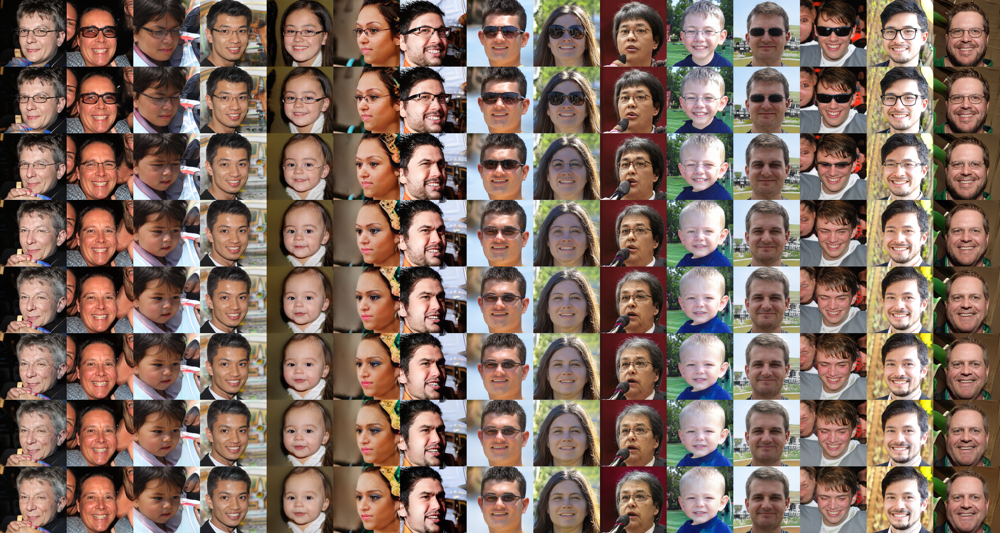

In [10]:
from PIL import Image

Image.open('drive/MyDrive/stylegan_vanilla/orig_to_glasses_layer_swap_grid.png')